In [2]:
#import sys
#sys.path.append('../input/pytorch-image-models/pytorch-image-models-master')
import collections
import gc
import json
import os
import random
import time
import warnings
from pprint import pprint
warnings.simplefilter("ignore")

from mpl_toolkits.axes_grid1 import ImageGrid
from albumentations import *
from albumentations.pytorch import ToTensorV2 as ToTensor
import cv2
from imblearn.under_sampling import RandomUnderSampler
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image, ImageFilter
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
#import tifffile as tiff
import timm
import torch
import torch.backends.cudnn as cudnn
import torch.nn as nn
from torch.nn import functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import DataLoader, Dataset, sampler
#from tqdm import tqdm_notebook as tqdm
from tqdm import tqdm

#import s3fs
#fs = s3fs.S3FileSystem()

%matplotlib inline
print(os.listdir())

['.ipynb_checkpoints', 'efficientnet_rescale_v1_aws', 'mnist.ipynb', 'crop_256x256_mega.ipynb', 'resnet50_v2_rescale', 'crop_original_size.ipynb', 'resnet50_v0(local)_old.ipynb', 'resnet50_v0(local).ipynb', 'resnet50_tracking_v0(aws).ipynb', 'resnet_v2(aws)_rescale.ipynb', 'resnet50_v1(local)_rescale.ipynb', 'efficientnet_v2(aws)_orig_ratio.ipynb', 'sub_tmp.csv', 'class_agnostic_labeling.ipynb', 'cropped_train_orig.csv', 'resnet50_rescaled_v2_300_.pth', '.git', '.gitignore', 'efficientnet_v1(aws)_rescale.ipynb', 'crop_original_ratio.ipynb', 'resnet50_tracking_v0(local).ipynb', 'resnet50_v1(local)_orig_size.ipynb', 'resnet50_tracking_v1(local)_SORT.ipynb', 'efficientnet_orig_ratio', 'class_agnostic_labeling_aws.ipynb', 'show_plots.py', 'not_tracking4.png', 'readme.md', 'crop_scale(aws).ipynb', 'resnet50_scaled_800_.pth', 'efficientnet_v1(local)_rescale.ipynb', 'networks', 'requirements.txt', 'show_plots(aws).ipynb', 'main.py', 'efficientnet_v0.ipynb', 'cropped_test_orig.csv']


### setting

In [3]:
prefix = "/home/ubuntu/data"
DATASET = prefix
CROPED_DATA = os.path.join(DATASET, "256x256")

TRAIN_CROPED_DATA = os.path.join(CROPED_DATA, "cropped_images_train")
TEST_CROPED_DATA = os.path.join(CROPED_DATA, "cropped_images_test")

In [4]:
DEVICE = ('cuda' if torch.cuda.is_available() else 'cpu')
print(DEVICE)
NUM_WORKERS = 0
SEED = 2021

cuda


In [5]:
def set_seed(seed=2**3):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
set_seed(SEED)

In [6]:
df_croped_img_ids_train = pd.read_csv(os.path.join(CROPED_DATA, "cropped_train.csv"))
df_croped_img_ids_test = pd.read_csv(os.path.join(CROPED_DATA, "cropped_test.csv"))

In [7]:
df_croped_img_ids_train.head()

,id,idx,category_id
0,905a3c8c-21bc-11ea-a13a-137349068a90,1,374
1,905a4416-21bc-11ea-a13a-137349068a90,1,97
2,905a4416-21bc-11ea-a13a-137349068a90,2,97
3,905a4416-21bc-11ea-a13a-137349068a90,3,97
4,905a579e-21bc-11ea-a13a-137349068a90,1,90


In [8]:
df_croped_img_ids_test.head()

,id,idx
0,915879a0-21bc-11ea-a13a-137349068a90,1
1,91588116-21bc-11ea-a13a-137349068a90,1
2,9158a2f4-21bc-11ea-a13a-137349068a90,1
3,9158aaa6-21bc-11ea-a13a-137349068a90,1
4,9158f1a0-21bc-11ea-a13a-137349068a90,1


### create train dataframe

In [11]:
with open(os.path.join(DATASET, 'metadata', 'iwildcam2021_train_annotations.json'), encoding='utf-8') as json_file:
    train_annotations =json.load(json_file)
df_train_annotation = pd.DataFrame(train_annotations["annotations"])
with open(os.path.join(DATASET, 'metadata', 'iwildcam2021_test_information.json'), encoding='utf-8') as json_file:
    test_information =json.load(json_file)
    
df_test_info = pd.DataFrame(test_information["images"])[["id", "seq_id"]]

In [12]:
df_train_information = pd.DataFrame(train_annotations["images"])[["id", "seq_id"]]
im2seq = dict()
seq2im = collections.defaultdict(list)
for i, row in df_train_information.iterrows():
    im2seq[row.id] = row.seq_id
    seq2im[row.seq_id].append(row.id)
print("training images", len(im2seq.keys()))
print("training sequences", len(seq2im.keys()))

for i, row in df_test_info.iterrows():
    im2seq[row.id] = row.seq_id
    seq2im[row.seq_id].append(row.id)

training images 203314
training sequences 36547


In [13]:
class_names = dict()
class_ids = []
for cat in train_annotations["categories"]:
    class_names[cat['id']] = cat['name']
    class_ids.append(cat['id'])
print(class_names)

{0: 'empty', 2: 'tayassu pecari', 3: 'dasyprocta punctata', 4: 'cuniculus paca', 6: 'puma concolor', 7: 'tapirus terrestris', 8: 'pecari tajacu', 9: 'mazama americana', 10: 'leopardus pardalis', 12: 'geotrygon montana', 13: 'nasua nasua', 14: 'dasypus novemcinctus', 15: 'eira barbara', 16: 'didelphis marsupialis', 20: 'procyon cancrivorus', 24: 'panthera onca', 25: 'myrmecophaga tridactyla', 26: 'tinamus major', 32: 'sylvilagus brasiliensis', 44: 'puma yagouaroundi', 50: 'leopardus wiedii', 62: 'mazama gouazoubira', 67: 'philander opossum', 70: 'capra aegagrus', 71: 'bos taurus', 72: 'ovis aries', 73: 'canis lupus', 74: 'lepus saxatilis', 77: 'turtur calcospilos', 78: 'papio anubis', 80: 'genetta genetta', 83: 'tragelaphus scriptus', 86: 'equus africanus', 89: 'herpestes sanguineus', 90: 'loxodonta africana', 91: 'cricetomys gambianus', 92: 'raphicerus campestris', 94: 'hyaena hyaena', 96: 'aepyceros melampus', 97: 'crocuta crocuta', 98: 'caracal caracal', 99: 'equus ferus', 100: 'pant

In [14]:
train = df_croped_img_ids_train[["id", "idx"]].merge(df_train_annotation[["image_id", "category_id"]], 
                                      left_on='id', right_on='image_id')[["id", "idx", "category_id"]]

In [15]:
df_categories = pd.DataFrame(train_annotations["categories"])
cat_idxs = df_categories["id"]

def convert_cat_to_index(x):
    return np.where(cat_idxs==x)[0][0]

In [16]:
print(convert_cat_to_index(3))
class_names[class_ids[2]]

2


'dasyprocta punctata'

In [17]:
train["category_id"] = train["category_id"].map(lambda x: convert_cat_to_index(x))

In [18]:
train.head()

,id,idx,category_id
0,905a3c8c-21bc-11ea-a13a-137349068a90,1,164
1,905a4416-21bc-11ea-a13a-137349068a90,1,39
2,905a4416-21bc-11ea-a13a-137349068a90,2,39
3,905a4416-21bc-11ea-a13a-137349068a90,3,39
4,905a579e-21bc-11ea-a13a-137349068a90,1,34


# Train

## Create dataset for training

In [19]:
# ====================================================
# Dataset for train
# ====================================================

mean = np.array([0.37087523, 0.370876, 0.3708759] )
std = np.array([0.21022698, 0.21022713, 0.21022706])

def img2tensor(img,dtype:np.dtype=np.float32):
    if img.ndim==2 : img = np.expand_dims(img,2)
    img = np.transpose(img,(2,0,1))
    return torch.from_numpy(img.astype(dtype, copy=False))

class IWildcamTrainDataset(Dataset):
    def __init__(self, df, tfms=None):
        self.ids = df["id"]
        self.idxs = df["idx"]
        self.categories = df["category_id"]
        self.tfms = tfms
        
    def __len__(self):
        return len(self.ids)
    
    def __getitem__(self, idx):
        size = (256, 256)
        image_id = self.ids[idx]
        image_idx = self.idxs[idx]
        iamge_categorie = self.categories[idx]
        
        image_path = os.path.join(TRAIN_CROPED_DATA, f"{image_id}_{image_idx}.jpg")
        img = cv2.resize(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB),size)

        if self.tfms is not None:
            augmented = self.tfms(image=img)
            img = augmented['image']
            
        # we should normalize here
        return img2tensor((img/255.0  - mean)/std), torch.tensor(iamge_categorie)

In [20]:
def get_aug(p=1.0):
    return Compose([
        HorizontalFlip(),
        ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=15, p=0.9, 
                         border_mode=cv2.BORDER_REFLECT),
        VerticalFlip(),
        RandomBrightnessContrast(p=0.9),
    ], p=p)

In [21]:
print(timm.list_models(pretrained=True))

['adv_inception_v3', 'cait_m36_384', 'cait_m48_448', 'cait_s24_224', 'cait_s24_384', 'cait_s36_384', 'cait_xs24_384', 'cait_xxs24_224', 'cait_xxs24_384', 'cait_xxs36_224', 'cait_xxs36_384', 'coat_lite_mini', 'coat_lite_tiny', 'cspdarknet53', 'cspresnet50', 'cspresnext50', 'densenet121', 'densenet161', 'densenet169', 'densenet201', 'densenetblur121d', 'dla34', 'dla46_c', 'dla46x_c', 'dla60', 'dla60_res2net', 'dla60_res2next', 'dla60x', 'dla60x_c', 'dla102', 'dla102x', 'dla102x2', 'dla169', 'dm_nfnet_f0', 'dm_nfnet_f1', 'dm_nfnet_f2', 'dm_nfnet_f3', 'dm_nfnet_f4', 'dm_nfnet_f5', 'dm_nfnet_f6', 'dpn68', 'dpn68b', 'dpn92', 'dpn98', 'dpn107', 'dpn131', 'eca_nfnet_l0', 'eca_nfnet_l1', 'ecaresnet26t', 'ecaresnet50d', 'ecaresnet50d_pruned', 'ecaresnet50t', 'ecaresnet101d', 'ecaresnet101d_pruned', 'ecaresnet269d', 'ecaresnetlight', 'efficientnet_b0', 'efficientnet_b1', 'efficientnet_b1_pruned', 'efficientnet_b2', 'efficientnet_b2_pruned', 'efficientnet_b3', 'efficientnet_b3_pruned', 'efficientn

## Create model

In [22]:
# ====================================================
# Resnet Model
# ====================================================

class rnet(nn.Module):

    def __init__(self, backbone, out_dim, pretrained=False):
        super(rnet, self).__init__()
        self.rnet = timm.create_model(backbone, pretrained=pretrained)
        in_ch = self.rnet.fc.in_features
        self.rnet.fc = nn.Linear(in_ch, out_dim)
        #self.rnet.classifier = nn.Identity()

    def forward(self, x):
        x = self.rnet(x)
        return x

## Train

Since we know that [the training data is imbalanced](https://www.kaggle.com/nayuts/iwildcam-2021-overviewing-for-start#EDA), I undersampled it.

In [23]:
rus = RandomUnderSampler(random_state=SEED, replacement=True)

def generate_dataloaders(train):
    
    train_resampled, _ = rus.fit_resample(train, train["category_id"])
    test_resampled, _ = rus.fit_resample(train, train["category_id"])

    train_resampled = train_resampled.reset_index(drop=True)
    test_resampled = test_resampled.reset_index(drop=True)
    
    ds_train = IWildcamTrainDataset(train_resampled, tfms=get_aug())
    dl_train = DataLoader(ds_train,batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)
    ds_test = IWildcamTrainDataset(test_resampled)
    dl_test = DataLoader(ds_test,batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)
    
    return dl_train, dl_test

# Inference

## Create dataset for test

In [24]:
# ====================================================
# Dataset for test
# ====================================================

mean = np.array([0.37087523, 0.370876, 0.3708759] )
std = np.array([0.21022698, 0.21022713, 0.21022706])

class IWildcamTestDataset(Dataset):
    def __init__(self, df, tfms=None):
        self.ids = df["id"]
        self.idx = df["idx"]
        self.tfms = tfms
        
    def __len__(self):
        return len(self.ids)
    
    def __getitem__(self, idx):
        size = (256, 256)
        image_id = self.ids[idx]
        image_idx = self.idx[idx]
        
        image_path = os.path.join(TEST_CROPED_DATA, f"{image_id}_{image_idx}.jpg")
        
        img = cv2.resize(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB),size)

        if self.tfms is not None:
            augmented = self.tfms(image=img)
            img = augmented['image']
            
        # we should normalize here
        return img2tensor((img/255.0 - mean)/std), image_id

In [25]:
ds_test = IWildcamTestDataset(df_croped_img_ids_test)
dl_test = DataLoader(ds_test,batch_size=32,shuffle=False,num_workers=NUM_WORKERS)

## Load trained model

In [26]:
model = rnet(backbone="resnet50", out_dim=205)
model.to(DEVICE)
model.load_state_dict(torch.load(f"resnet50_scaled_800_.pth"))
model.eval()

rnet(
  (rnet): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act1): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act1): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act2): ReLU(inplace=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act3):

In [27]:
pred_categories = []
pred_img_ids = []
pred_raw_outputs = []

## inference

In [28]:
with torch.no_grad():
    for imgs, img_ids in tqdm(dl_test):
        imgs = imgs.to(DEVICE)
        
        outputs = model(imgs)
        output_labels = torch.argmax(outputs, dim=1).tolist()
        pred_raw_outputs += outputs.tolist()
        pred_categories += output_labels
        pred_img_ids += img_ids

100%|██████████| 1008/1008 [03:27<00:00,  4.86it/s]


In [29]:
pred = collections.defaultdict(list)
pred_values = collections.defaultdict(list)

for category, img_id in zip(pred_categories, pred_img_ids):
    pred[img_id].append(category)
    
for values, img_id in zip(pred_raw_outputs, pred_img_ids):
    pred_values[img_id].append(values)

In [30]:
pred

defaultdict(list,
            {'915879a0-21bc-11ea-a13a-137349068a90': [56],
             '91588116-21bc-11ea-a13a-137349068a90': [32],
             '9158a2f4-21bc-11ea-a13a-137349068a90': [198],
             '9158aaa6-21bc-11ea-a13a-137349068a90': [56],
             '9158f1a0-21bc-11ea-a13a-137349068a90': [57],
             '9159244a-21bc-11ea-a13a-137349068a90': [182],
             '91599f88-21bc-11ea-a13a-137349068a90': [4],
             '915a05ea-21bc-11ea-a13a-137349068a90': [74],
             '915a0cde-21bc-11ea-a13a-137349068a90': [87,
              87,
              201,
              201,
              201,
              201],
             '915a41b8-21bc-11ea-a13a-137349068a90': [99, 87, 50],
             '915a9f14-21bc-11ea-a13a-137349068a90': [66],
             '915aa658-21bc-11ea-a13a-137349068a90': [4],
             '915ad13c-21bc-11ea-a13a-137349068a90': [56],
             '915ad448-21bc-11ea-a13a-137349068a90': [99],
             '915b3d3e-21bc-11ea-a13a-137349068a90': [

In [31]:
pred_values

defaultdict(list,
            {'915879a0-21bc-11ea-a13a-137349068a90': [[4.124115467071533,
               0.5598804354667664,
               3.6636054515838623,
               -2.479158401489258,
               2.8186070919036865,
               -2.0715739727020264,
               -3.658557415008545,
               -3.991208791732788,
               -2.24111270904541,
               4.207794189453125,
               -1.6914746761322021,
               0.04407021775841713,
               -0.9904676079750061,
               -3.081059455871582,
               0.21433311700820923,
               -2.9375674724578857,
               3.0776004791259766,
               3.5559027194976807,
               0.5843738317489624,
               -1.2866109609603882,
               3.24871563911438,
               -2.629577398300171,
               3.4268720149993896,
               3.2031311988830566,
               -2.0500197410583496,
               -3.11611008644104,
               -2.363633394241

In [32]:
df_test_info.head()

,id,seq_id
0,8b31d3be-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
1,8cf202be-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
2,8a87e62e-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
3,8e6994f4-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
4,948b29e2-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002


In [33]:
with open(os.path.join(DATASET, "metadata", "iwildcam2021_megadetector_results.json")) as f:
    megadetector = json.load(f)
print(megadetector["info"])
print(megadetector["detection_categories"])

{'format_version': '1.0', 'detector': 'megadetector_v3', 'detection_completion_time': '2020-01-10 08:49:05'}
{'2': 'person', '1': 'animal'}


In [39]:
boxes = collections.defaultdict(list)

for category, img_id in zip(pred_categories, pred_img_ids):
    pred[img_id].append(category)
for s in megadetector["images"]:
    for det in s["detections"]:
        if det["conf"] > .9:
            boxes[s["id"]].append(det['bbox'])

seqs = np.array(df_test_info['seq_id'].unique().tolist())

In [40]:
print(seqs[:10])

['a91ebc18-0cd3-11eb-bed1-0242ac1c0002'
 'a91d6764-0cd3-11eb-bed1-0242ac1c0002'
 '91ccb676-21bc-11ea-a13a-137349068a90'
 '386914ce-6fe2-11eb-844f-0242ac1c0002'
 '988ae29e-21bc-11ea-a13a-137349068a90'
 '9649273e-21bc-11ea-a13a-137349068a90'
 '947b2c2c-21bc-11ea-a13a-137349068a90'
 '386af23a-6fe2-11eb-844f-0242ac1c0002'
 '96760128-21bc-11ea-a13a-137349068a90'
 'a91f1154-0cd3-11eb-bed1-0242ac1c0002']


In [41]:
print(boxes["945336fe-21bc-11ea-a13a-137349068a90"])
for c in megadetector["images"]:
    if c["id"] == "945336fe-21bc-11ea-a13a-137349068a90":
        print(c)
        break

[]
{'detections': [{'category': '1', 'bbox': [0.5515, 0.4134, 0.036, 0.0598], 'conf': 0.754}, {'category': '1', 'bbox': [0.5549, 0.4148, 0.0308, 0.0376], 'conf': 0.477}, {'category': '1', 'bbox': [0.5449, 0.4125, 0.0436, 0.0855], 'conf': 0.349}], 'id': '945336fe-21bc-11ea-a13a-137349068a90', 'max_detection_conf': 0.754}


Seq 38, count: 0


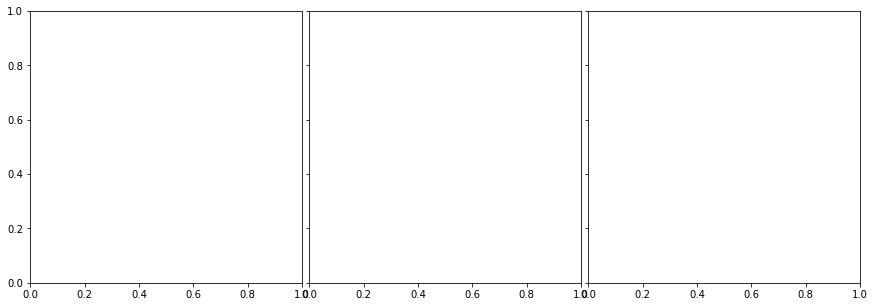

In [42]:
# Show Untracked
show = [38]
im_ids = []
tot_imgs = 0
ims_pre_row = 3
match_thresh = .08
dist_thresh = .2
    
for seq_id in show:
    im_ids.append(seq2im[seq_id])
    tot_imgs += len(im_ids[-1])
    
fig = plt.figure(figsize=(20., int(tot_imgs/ims_pre_row + 1) * 5.))
grid = ImageGrid(fig, 111,  
                 nrows_ncols=(int(tot_imgs/ims_pre_row + 1), ims_pre_row),  
                 axes_pad=(0.1, .3))

size = (256, 256)
#im_ids[0].sort()
curr_ax = 0

for i, seq in enumerate(show):
    unique_animals = [] # [id, normed(last_pred_value), normed(last_xy), cumulative_pred_value, seen_count]
    seq_im_ids = im_ids[i]
    for im in seq_im_ids:
        all_preds = np.array(pred_values[im])
        for pred_value, box in zip(all_preds, boxes[im]):
            pred_value = pred_value / np.linalg.norm(pred_value)
            found = False
            xy = np.array(box[0:2])
            for j, last_pred_value, last_xy, cum_pred_value, seen_count in unique_animals:
                if np.linalg.norm(last_pred_value * pred_value) > match_thresh and np.linalg.norm(xy - last_xy) < dist_thresh:
                    unique_animals[j] = [j, pred_value, xy, cum_pred_value + pred_value, seen_count + 1]
                    found = True
                    break
            if found == False:
                unique_animals.append([len(unique_animals), pred_value, xy, pred_value, 1])
                
    for im in seq_im_ids:
        # Iterating over the grid returns the Axes.
        ax = grid[curr_ax]
        curr_ax += 1
        bboxes = boxes[im]
        ax.set_title(im)
        image_path = os.path.join(DATASET, "test", im+".jpg")
        img = cv2.resize(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB), size)
        for j, box in enumerate(bboxes):
            #print(i, len(pred[im]), image_name)
            box_label = pred[im][j]
            xy = (np.array(box[0:2]) * [len(img), len(img[0])]).astype(int)
            wh = (np.array(box[2:4]) * [len(img), len(img[0])]).astype(int)
            xy = (np.array(box[0:2]) * size).astype(int)
            wh = (np.array(box[2:4]) * size).astype(int)
            cv2.rectangle(img, tuple(xy), tuple(xy + wh), (0, 255, 0), 2)
            cv2.putText(img, class_names[class_ids[box_label]], tuple(xy+[0, 10]), cv2.FONT_HERSHEY_SIMPLEX, .6, (255, 0, 0), 2)
        ax.get_yaxis().set_ticks([])
        ax.get_xaxis().set_ticks([])
        ax.imshow(img)
    
    print(f"Seq {seq}, count: {len(unique_animals)}")
    for unique_animal in unique_animals:
        print(class_names[class_ids[np.argmax(unique_animal[3])]])
        
    seq_im_ids = im_ids[i]
    

#plt.savefig("not_tracking4.png")
plt.show()

error: OpenCV(4.5.2) ../modules/imgproc/src/color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


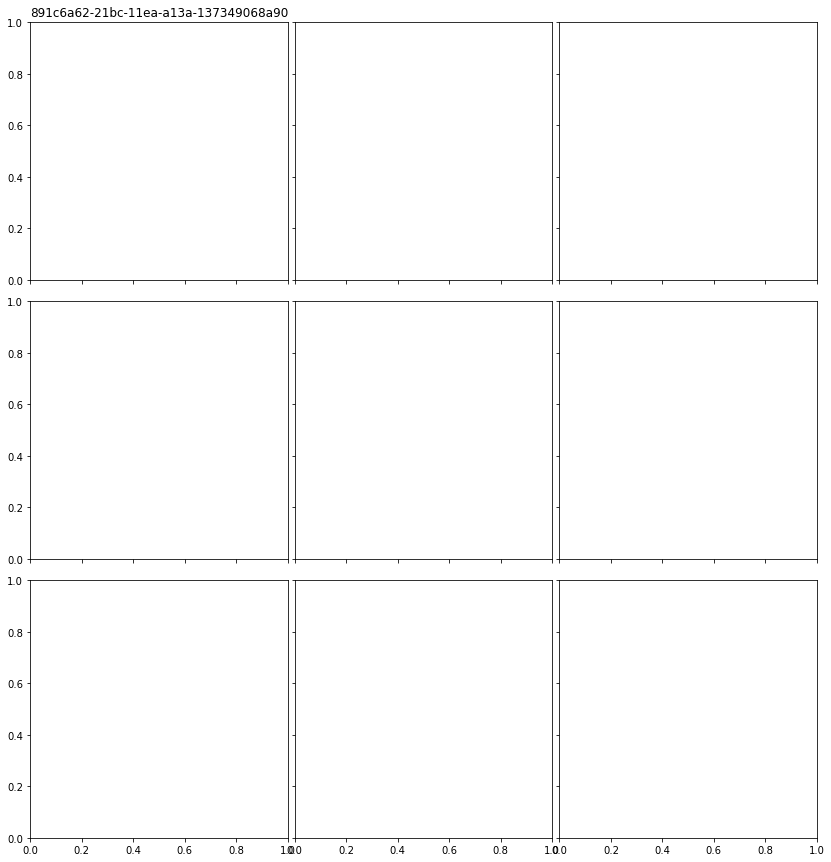

In [43]:
# Show Tracked
show = [37] # 17, 36-38
im_ids = []
tot_imgs = 0
ims_pre_row = 3
match_thresh = .08
dist_thresh = .2
colors = [(0, 255, 0), (255, 255, 0), (0, 255, 255)]
    
for seq_id in show:
    im_ids.append(np.array(df_test_info[df_test_info["seq_id"] == seqs[seq_id]]["id"]))
    tot_imgs += len(im_ids[-1])
    
fig = plt.figure(figsize=(20., int(tot_imgs/ims_pre_row + 1) * 5.))
grid = ImageGrid(fig, 111,  
                 nrows_ncols=(int(tot_imgs/ims_pre_row + 1), ims_pre_row),  
                 axes_pad=(0.1, .3))

size = (256, 256)
#im_ids[0].sort()
curr_ax = 0

for i, seq in enumerate(show):
    unique_animals = [] # [id, normed(last_pred_value), normed(last_xy), cumulative_pred_value, seen_count]
    seq_im_ids = im_ids[i]
    show_info = []
    for im in seq_im_ids:
        show_info.append([])
        all_preds = np.array(pred_values[im])
        for pred_value, box in zip(all_preds, boxes[im]):
            pred_value = pred_value / np.linalg.norm(pred_value)
            found = False
            xy = np.array(box[0:2])
            wh = np.array(box[2:4])
            for j, last_pred_value, last_xy, cum_pred_value, seen_count in unique_animals:
                if np.linalg.norm(last_pred_value * pred_value) > match_thresh and np.linalg.norm(xy - last_xy) < dist_thresh:
                    unique_animals[j] = [j, pred_value, xy, cum_pred_value + pred_value, seen_count + 1]
                    show_info[-1].append([j, xy, wh, (xy - last_xy)])
                    found = True
                    break
            if found == False:
                unique_animals.append([len(unique_animals), pred_value, xy, pred_value, 1])
                show_info[-1].append([len(unique_animals)-1, xy, wh, None])
    
    
    id_to_name = [(cum_pred_value.argsort()[-1]) for j, last_pred_value, last_xy, cum_pred_value, seen_count in unique_animals]
    for im, infos in zip(seq_im_ids, show_info):
        #print(df_train_annotation[df_train_annotation["image_id"] == im])
        #print(im)
        # Iterating over the grid returns the Axes.
        ax = grid[curr_ax]
        curr_ax += 1
        bboxes = boxes[im]
        ax.set_title(im)
        image_path = os.path.join(DATASET, "test", im+".jpg")
        img = cv2.resize(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB), size)
        for j, info in enumerate(infos):
            #print(i, len(pred[im]), image_name)
            box_label = id_to_name[info[0]]
            xy = (info[1] * size).astype(int)
            wh = (info[2] * size).astype(int)
            cv2.rectangle(img, tuple(xy), tuple(xy + wh), colors[info[0]], 2)
            cv2.putText(img, class_names[class_ids[box_label]], tuple(xy+[0, 10]), cv2.FONT_HERSHEY_SIMPLEX, .6, (255, 0, 0), 2)
        ax.get_yaxis().set_ticks([])
        ax.get_xaxis().set_ticks([])
        ax.imshow(img)
    
    print(f"Seq {seq}, count: {len(unique_animals)}")
    for unique_animal in unique_animals:
        print(class_names[class_ids[np.argmax(unique_animal[3])]])
        print(class_names[class_ids[np.argmax(unique_animal[3])]])
        
    seq_im_ids = im_ids[i]
    

#plt.savefig("tracking4.png")
plt.show()

# Create submit file

In [90]:
sub = pd.read_csv(os.path.join(DATASET, 'sample_submission.csv'))
col_Predicted = [col for col in sub.columns if "Predicted" in col]

In [91]:
sub = pd.read_csv(os.path.join(DATASET, 'sample_submission.csv'))
# zero everything
for col in sub.columns[1:]:
    sub[col] = 0
    #print(col, np.sum(np.array(sub[col]).astype("float")))

In [92]:
with open(os.path.join(DATASET, 'metadata/iwildcam2021_train_annotations.json'), encoding='utf-8') as json_file:
    train_annotations =json.load(json_file)
df_categories = pd.DataFrame.from_records(train_annotations["categories"])

In [93]:
im_ids = []
tot_imgs = 0
    
for seq_id in tqdm(seqs):
    #print(seq_id)
    #print(df_test_info[df_test_info["seq_id"] == seq_id]["id"])
    im_ids.append(np.array(seq2im[seq_id]))
    tot_imgs += len(im_ids[-1])

100%|██████████| 11057/11057 [00:00<00:00, 256231.81it/s]


In [94]:
sub

,Id,Predicted2,Predicted3,Predicted4,Predicted6,Predicted7,Predicted8,Predicted9,Predicted10,Predicted12,...,Predicted559,Predicted562,Predicted563,Predicted564,Predicted565,Predicted566,Predicted567,Predicted568,Predicted570,Predicted571
0,32ce8026-7ec9-11eb-b675-4f3cc0c82eb3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,945c6602-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,a91c7e26-0cd3-11eb-bed1-0242ac1c0002,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,9926239e-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9672184c-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11052,96aedea8-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11053,98bf9b2e-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11054,3867ac88-6fe2-11eb-844f-0242ac1c0002,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11055,940f8f6c-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [95]:
seqs2 = ['a9190c5a-0cd3-11eb-bed1-0242ac1c0002']

In [96]:
match_thresh = .085
dist_thresh = .2

counts = np.zeros((len(sub), 205))
#sub.set_index(['id'])
for i, seq in tqdm(enumerate(sub["Id"])):
    unique_animals = [] # [id, normed(last_pred_value), normed(last_xy), cumulative_pred_value, seen_count]
    seq_im_ids = im_ids[i]
    for im in seq2im[seq]:
        all_preds = np.array(pred_values[im])
        for pred_value, box in zip(all_preds, boxes[im]):
            pred_value = pred_value / np.linalg.norm(pred_value)
            found = False
            xy = np.array(box[0:2])
            for j, last_pred_value, last_xy, cum_pred_value, seen_count in unique_animals:
                if np.linalg.norm(last_pred_value * pred_value) > match_thresh and np.linalg.norm(xy - last_xy) < dist_thresh:
                    unique_animals[j] = [j, pred_value, xy, cum_pred_value + pred_value, seen_count + 1]
                    found = True
                    break
            if found == False:
                unique_animals.append([len(unique_animals), pred_value, xy, pred_value, 1])
    #row = sub[sub["Id"] == seq].index
    #print(row)
    for unique_animal in unique_animals:
        #print(unique_animal[-2])
        #print(np.array(unique_animal[-2]).argsort())
        #rint(sub.iloc[row].iloc[np.array(unique_animal[-2]).argsort()[-1]])
        counts[i, np.array(unique_animal[-2]).argsort()[-1]] += 1
        
columns = sub.columns
for column in range(1, 205):
    sub[columns[column]] = counts[:, column]

11057it [00:01, 7476.06it/s]


In [97]:
sub.to_csv("./sub_trackingv3.csv", index=False)

In [88]:
sub["total"]

KeyError: 'total'

In [74]:
# class agnostic count
sum_counts = []
for i in tqdm(range(len(sub))):
    sum_counts.append(sum(sub.iloc[i][col_Predicted]))
print(sum_counts)
sub["total"] = sum_counts

100%|██████████| 11057/11057 [00:08<00:00, 1358.35it/s]

[1.0, 0.0, 2.0, 2.0, 0.0, 1.0, 3.0, 0.0, 3.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 2.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 2.0, 0.0, 0.0, 2.0, 1.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, 2.0, 1.0, 2.0, 2.0, 0.0, 1.0, 0.0, 0.0, 2.0, 0.0, 2.0, 4.0, 0.0, 0.0, 3.0, 0.0, 2.0, 1.0, 0.0, 0.0, 0.0, 2.0, 1.0, 0.0, 0.0, 0.0, 1.0, 2.0, 2.0, 1.0, 0.0, 2.0, 2.0, 0.0, 1.0, 1.0, 2.0, 0.0, 4.0, 3.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 2.0, 2.0, 1.0, 2.0, 2.0, 2.0, 2.0, 1.0, 5.0, 0.0, 0.0, 0.0, 3.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 1.0, 4.0, 3.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0.0, 1.0, 0.0, 0.0, 3.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 2.0, 0.0, 1.0, 2.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 3.0, 4.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 2.0, 1.0, 0.0, 0.0, 1.0, 3.0, 1.0, 2.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 1.0, 0.0, 1.0, 0.0, 2.0, 2.0, 4.0, 0.0, 2.0, 0.0, 0.0,

In [75]:
test_counts = {'a9190c5a-0cd3-11eb-bed1-0242ac1c0002': 8, 'a92467da-0cd3-11eb-bed1-0242ac1c0002': 12, 'a9233040-0cd3-11eb-bed1-0242ac1c0002': 4, 'a92030a2-0cd3-11eb-bed1-0242ac1c0002': 4, '32d04988-7ec9-11eb-b675-4f3cc0c82eb3': 4, 'a924d558-0cd3-11eb-bed1-0242ac1c0002': 5, 'a9203020-0cd3-11eb-bed1-0242ac1c0002': 4, 'a925baae-0cd3-11eb-bed1-0242ac1c0002': 6, 'a925bb1c-0cd3-11eb-bed1-0242ac1c0002': 4, 'a925b9be-0cd3-11eb-bed1-0242ac1c0002': 9}

In [76]:
sub[sub["Id"] == 'a9190c5a-0cd3-11eb-bed1-0242ac1c0002']

,Id,Predicted2,Predicted3,Predicted4,Predicted6,Predicted7,Predicted8,Predicted9,Predicted10,Predicted12,...,Predicted562,Predicted563,Predicted564,Predicted565,Predicted566,Predicted567,Predicted568,Predicted570,Predicted571,total
7723,a9190c5a-0cd3-11eb-bed1-0242ac1c0002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,3.0,1.0,0.0,0.0,6.0


In [77]:
sum(counts[:, 0])

17.0

In [78]:
err = 0.0
for seq_id in test_counts.keys():
    print(int(sub[sub["Id"] == seq_id]["total"]))
    err += (int(sub[sub["Id"] == seq_id]["total"]) - test_counts[seq_id])**2
print(err)

6
9
3
5
3
6
4
6
4
4
42.0


In [53]:
sub_max = dict()
sub_min = dict()

In [54]:
# get baseline results
for seq_id in sub["Id"]:
    low = None
    high = None
    for im in seq2im[seq_id]:
        curr = len(boxes[im])
        if low is None or low > curr:
            low = curr
        if high is None or high < curr:
            high = curr
    sub_max[seq_id] = high
    sub_min[seq_id] = low

In [55]:
max_err = 0.0
for seq_id in test_counts.keys():
    print(sub_max[seq_id])
    max_err += (sub_max[seq_id] - test_counts[seq_id])**2
print(max_err)

7
10
4
4
4
6
4
6
4
6
15.0


In [56]:
min_err = 0.0
for seq_id in test_counts.keys():
    print(sub_min[seq_id])
    min_err += (sub_min[seq_id] - test_counts[seq_id])**2
print(min_err)

4
1
3
1
3
3
2
3
2
2
218.0
